In [1]:
import FalseColor_methods as fc 
from FCdataobject import DataObject
import h5py as hp
import numpy as np
import tifffile as tf
import os 
import json
import glob
import skimage.filters as filt
import cv2
import time
import skimage.morphology as morph
from scipy import stats
import skimage.feature as feat
import skimage.exposure as ex
import skimage.measure as me
import scipy.ndimage as nd
import skimage.segmentation as sg
%matplotlib notebook
import matplotlib.pyplot as plt


In [2]:
def ViewImage(Images,title=None,do_hist = False,figsize = (8,6)):
    if do_hist:
        f,ax = plt.subplots(ncols = 2,figsize = figsize)
        ax[0].imshow(Images)
        ax[0].set_title('Image')
        ax[1].hist(Images[Images != 0].ravel(),256,[0,Images.max()])
        ax[1].set_title('Histogram')
        if title is not None:
            f.suptitle(title)
    else:
        f,ax = plt.subplots(figsize=figsize)
        ax.imshow(Images)
        if title is not None:
            ax.set_title(title)
    return f,ax

def convert_8bit(img):
    return (img/256).astype(np.uint8)

def float_2int(img,normfactor = 256,dtype = 'uint8'):
    return (img*normfactor).astype(dtype)

def execute_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=8.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return cl1

def create_clahe():
    return cv2.createCLAHE(clipLimit=8.0,tileGridSize=(8,8))

def segment_nuclei(image,equal_threshold = 30,size_threshold = 10):
     #equalize image histogram, remove noise
    kernal = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(51,51))
    image = cv2.morphologyEx(image,cv2.MORPH_TOPHAT,kernal)
    image = convert_8bit(image)
    image = cv2.medianBlur(image,3)
    img_equalized = execute_clahe(image)
    
    img_equalized[img_equalized<equal_threshold] = 0
    img_equalized -= stats.mode(img_equalized,axis=None)[0]
#     ViewImage(img_equalized)

    el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    dilated_img = cv2.dilate(img_equalized,el)

    binary_dilated = cv2.adaptiveThreshold(dilated_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                            cv2.THRESH_BINARY,21,-3)

    binary_opened = cv2.morphologyEx(binary_dilated, cv2.MORPH_OPEN, el)

    distance = nd.distance_transform_edt(binary_opened)
    local_maxi = feat.peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                                labels=binary_opened)

    markers = nd.label(local_maxi)[0]
    labels = morph.watershed(-distance, markers, mask=binary_dilated,watershed_line=True)

    labels = morph.remove_small_objects(labels,size_threshold)
    ViewImage(labels,'Segmented Nuclei')

    return labels


def dilation_method(img):
    el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
    dilated_img = cv2.dilate(img,el)
    return dilated_img

In [3]:
datapath = os.path.join(os.getcwd(),'h5_sample_data')
datafile = os.path.join(datapath,'data-f0.h5')

testData = DataObject(directory=datapath)

In [4]:
testData.setupH5data(folder=datapath)

['__DATA_TYPES__', 's00', 's01', 't00000']
(1025, 717, 1025, 2)


In [5]:
channelIDs = ['s00', 's01']

In [6]:
colorSingle_runnable = {'runnable' : fc.singleChannel_falseColor}
falseColor_runnable = {'runnable' : fc.falseColor, 'kwargs' : {'channelIDs':channelIDs}}
preprocess_runnable = {'runnable' : fc.preProcess, 'kwargs' : None}
combine_runnable = {'runnable' : fc.combineFalseColoredChannels, 'args' : None}
adaptive_runnable = {'runnable' : fc.adaptiveBinary, 'kwargs': {'blocksize':300}}
segment_runnable = {'runnable' : segment_nuclei, 'kwargs': {'equal_threshold' : 40,
                                                           'size_threshold' : 15}}
dilation_runnable = {'runnable':dilation_method,'kwargs':None}

clahe_runnable = {'runnable':execute_clahe,'kwargs':None}

In [7]:
trial_set = testData.imageSet[:40]
testimg = trial_set[0][:,:,0]

In [ ]:
trial_nuclei = trial_set[:,:,:,0]
trial_nuclei.shape

In [ ]:
#with tophat 
# segmented_trial_nuclei = np.zeros(trial_nuclei.shape)
for i,z in enumerate(trial_nuclei):
    segment_nuclei(z)

In [ ]:
plt.close('all')

In [ ]:
segmented_trial_nuclei = np.zeros(trial_nuclei.shape)
for i,z in enumerate(trial_nuclei):
    segmented_trial_nuclei[i] = segment_nuclei(z)

In [ ]:
ViewImage(gaus_nuclei)
ViewImage(norm_nuclei)

In [ ]:

el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(31,31))
white_filtered_31 = cv2.morphologyEx(trial_nuclei[24],cv2.MORPH_TOPHAT,el)
segment_nuclei(white_filtered_31)
el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(51,51))
white_filtered_51 = cv2.morphologyEx(trial_nuclei[24],cv2.MORPH_TOPHAT,el)
segment_nuclei(white_filtered_51)
ViewImage(trial_nuclei[24])

In [ ]:
ViewImage(execute_clahe(convert_8bit(trial_nuclei[24])))
ViewImage(segmented_trial_nuclei[24])

In [ ]:
# test_segment = segment_nuclei(testimg.astype(np.uint8))
equalized_trial = segment_nuclei(trial_nuclei[25],equal_threshold=25,size_threshold=5)

In [ ]:
t0 = time.time()
combined_false_colored_data = testData.processImages(falseColor_runnable,imageSet=testData.imageSet)
print(time.time()-t0)

In [ ]:
plt.close('all')
for i in range(50,55):
    f,ax = plt.subplots(ncols = 2, figsize = (9,4))
    ax[0].imshow(testData.imageSet[i,:,:,0])
    ax[0].set_title('Tile %s Nuclei'%(i),fontsize = 12)
    ax[1].imshow(testData.imageSet[i,:,:,1])
    ax[1].set_title('Tile %s Cytoplasm'%(i),fontsize = 12)
#     ax[1][0].imshow(combined_false_colored_data[0][i])
#     ax[1][0].set_title('False Coloring',fontsize = 12)
#     f.delaxes(ax[1][1])
#     f.suptitle('Tile %s' %(i))

In [ ]:
for i in range(50,55):
    plt.subplots(figsize = (8,6))
    plt.imshow(combined_false_colored_data[0][i])
    plt.title('Tile %s, False Coloring'%(i), fontsize = 12)

In [ ]:
plt.close('all')

In [ ]:
test_Clahe = execute_clahe(testimg.astype('uint16'))
ViewImage(test_Clahe)

In [ ]:
testimg1 = convert_8bit(testimg)
img_equalized = execute_clahe(testimg1)
img_equalized[img_equalized<40]=0
img_med = cv2.medianBlur(img_equalized,5)
# ViewImage(img_med)

el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
dilated_img = cv2.dilate(img_equalized,el)
# ViewImage(dilated_img)
# ViewImage(cv2.erode(dilated_img,el))


binary_dilated = cv2.adaptiveThreshold(dilated_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                        cv2.THRESH_BINARY,21,-3)

binary_opened = cv2.morphologyEx(binary_dilated, cv2.MORPH_OPEN, el)

dist_trans = cv2.distanceTransform(binary_opened,cv2.DIST_L2,3)
dist_trans /= dist_trans.max()
dist_trans = ex.equalize_adapthist(dist_trans,nbins=10)


In [ ]:
t0 = time.time()
for i,z in enumerate(trial_nuclei):
    print(i)
    segment_nuclei(z)
print(time.time()-t0)

In [ ]:
test_segmented = segment_nuclei(trial_set[25][:,:,0])
ViewImage(test_segmented)
ViewImage(trial_set[25][:,:,0])

In [ ]:
print(testimg.dtype)
testimg1 = convert_8bit(testimg)
img_equalized = execute_clahe(testimg1)
img_equalized[img_equalized<40]=0
img_med = cv2.medianBlur(img_equalized,5)

el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
dilated_img = cv2.dilate(img_med,el)

binary_dilated = cv2.adaptiveThreshold(dilated_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                        cv2.THRESH_BINARY,21,-3)

binary_opened = cv2.morphologyEx(binary_dilated, cv2.MORPH_OPEN, el)

distance = nd.distance_transform_edt(binary_opened)
local_maxi = feat.peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                            labels=binary_dilated)
markers = nd.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=binary_dilated,watershed_line=True)
ViewImage(labels)
labels_filtered = morph.remove_small_objects(labels,15)
ViewImage(labels_filtered,do_hist=False)

ViewImage(testimg,do_hist=False)

In [ ]:
distance = ndi.distance_transform_edt(binary_opened)
local_maxi = feat.peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                            labels=binary_dilated)
markers = ndi.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=binary_dilated,watershed_line=True)
ViewImage(labels)
labels_filtered = morph.remove_small_objects(labels,15)
ViewImage(labels_filtered,do_hist=False)

ViewImage(testimg,do_hist=False)

In [ ]:

distance = nd.distance_transform_edt(binary_opened)
local_maxi = feat.peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                            labels=binary_dilated)
markers = ndi.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=binary_dilated,watershed_line=True)
ViewImage(labels,do_hist=False)
ViewImage(testimg)

In [ ]:
from scipy.stats import mode

testimg1 = convert_8bit(testimg)
ViewImage(testimg1,'Original Image')
# testimg1 = ex.equalize_adapthist(testimg1,nbins=512)
testimg1 = cv2.equalizeHist(testimg1)
testimg1[testimg1 >0] -= mode(testimg1,axis=None)[0]
ViewImage(testimg1,'Equalized')
median_img = cv2.medianBlur(testimg1,3)
median_img[median_img>0] -= mode(median_img[median_img>0],axis=None)[0]
kernal = np.ones((1,1)).astype('uint8')
median_img = cv2.erode(median_img,kernal)
ViewImage(median_img)

median_threshed = cv2.adaptiveThreshold(median_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                        cv2.THRESH_BINARY,11,-3)



ViewImage(median_threshed)
labeled_median = label_remove(median_threshed)
ViewImage(labeled_median)

In [ ]:
plt.close('all')

In [ ]:
testimg1 = ex.equalize_adapthist(testimg,nbins = 512)
testimg1[testimg1<.12] = 0

ViewImage(testimg1)

opened = morph.opening(testimg1)
ViewImage(opened)

eroded = morph.erosion(testimg1)
ViewImage(eroded)

bin_eroded = eroded > filt.threshold_local(eroded,block_size=21)
ViewImage(bin_eroded.astype(int))

bin_open = opened > filt.threshold_local(opened,block_size = 21)
bin_open = morph.binary_opening(bin_open)
ViewImage(bin_open)

ViewImage(opened*bin_open)

ViewImage(sg.watershed(filt.median(opened*bin_open)))



In [ ]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

test = testimg[600:670,400:600]
ViewImage(test)
mask = bin_open[600:670,400:600]
print(test.shape)
graph = image.img_to_graph(test)
print(graph.shape)
graph.data = np.exp(-graph.data / graph.data.std())

# Force the solver to be arpack, since amg is numerically
# unstable on this example
print(graph.shape)
labels = spectral_clustering(graph, n_clusters=1, eigen_solver='arpack')
# label_im = np.full(test.shape, -1.)
# label_im[test] = labels
# ViewImage(label_im)


In [ ]:
labels.shape

In [ ]:
plt.close('all')

In [ ]:
def label_remove(binary_img):
    binary_img = morph.remove_small_holes(binary_img)
#     binary_img = morph.binary_opening(binary_img)
    
    newimg = morph.label(binary_img)
    
    newimg = morph.remove_small_objects(newimg,15)
    return newimg

plt.close('all')

In [ ]:
plt.close('all')
med_filt = filt.median(testimg)

plt.subplots()
plt.imshow(testimg - med_filt)

test_equal = ex.equalize_adapthist(testimg - med_filt)
test_equal[test_equal<.1] = 0
plt.subplots()
plt.imshow(test_equal)

equal_opened = morph.opening(test_equal,selem=morph.disk(3))
equal_opened = ex.equalize_adapthist(equal_opened,nbins=1024)

plt.subplots()
plt.imshow(equal_opened)

bin_open = equal_opened > filt.threshold_local(equal_opened,block_size=35)
plt.subplots()
plt.imshow(bin_open)

In [ ]:
from scipy import ndimage


plt.subplots()
plt.imshow(morph.binary_erosion(bin_open))

distance = ndimage.distance_transform_edt(bin_open)
local_maxi = feat.peak_local_max(
    distance, indices=False, footprint=np.ones((3, 3)), labels=bin_open)
markers = ndimage.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=bin_open,watershed_line=True)

plt.subplots()
plt.imshow(labels)

In [ ]:
linear_timeset = []
for j in range(10):
    print('On set: ',j)
    t = time.time()
    for i in range(len(testData.imageSet)):
        if (i % 100) == 0:
            print(i)
        fc.falseColor(testData.imageSet[i],channel_IDs)
    linear_timeset.append(time.time() - t)

In [ ]:
batch_timeset = []
for i in range(10):
    print(i)
    t0 = time.time()
    combined_false_colored_data = testData.processImages(falseColor_runnable,channel_IDs,singleSet=False,imageSet=testData.imageSet)
    batch_timeset.append(time.time()-t0)

In [ ]:
import copy

batch_timeset_duplicate = copy.deepcopy(batch_timeset)
print(batch_timeset_duplicate)

In [ ]:
linear_timeset_duplicate = copy.deepcopy(linear_timeset)
print(linear_timeset_duplicate)

In [ ]:
testData.imageSet.shape

In [ ]:
batch_timeset_backup = [59.47043299674988, 52.01245307922363, 49.04718828201294, 49.74736309051514, 49.727221965789795, 51.61478805541992, 49.95790219306946, 49.001585245132446, 50.1013822555542, 48.99890995025635]

In [ ]:
linear_timeset_backup = [90.1305742263794, 87.23316216468811, 84.08562207221985, 81.38473105430603, 79.31263327598572, 78.34552383422852, 74.36614680290222, 72.15193295478821, 70.83032202720642, 68.37054300308228]

In [ ]:
linear_std = np.std(linear_timeset_backup)
batch_std = np.std(batch_timeset_backup)

linear_mean = np.average(linear_timeset_backup)
batch_mean = np.average(batch_timeset_backup)

print('linear mean: ', linear_mean)
print('batch mean:', batch_mean)

In [ ]:
width = 0.15
ind = np.arange(2)

f,ax = plt.subplots(figsize = (4,5))

ax.bar(width,linear_mean,width = width, yerr = linear_std)
ax.text(width + .01,linear_mean+.5,'%s+/-%s' %(round(linear_mean,2),round(linear_std,2)),fontsize = 8)

ax.bar(2*width + .03,batch_mean,width = width,yerr = batch_std)
ax.text(2*width +.04,batch_mean+.5,  '%s+/-%s' %(round(batch_mean,2),round(batch_std,2)),fontsize=8)

ax.set_xticks([width,2*width + .03])
ax.set_xticklabels(['Linear','Batch'])
ax.set_ylabel('Averate Computation Time, seconds')
ax.set_xlim(0,.5)
plt.title('False Color Speed Test')
plt.show()

In [ ]:
"""
###############################################################################################

Below will be the development of 3D clahe in python based on Moraes et al 2018
international conference on computer vision theory and applications


"""

In [ ]:
def subdivide_3D(images,size =(8,8,8)):
    

<IPython.core.display.Javascript object>


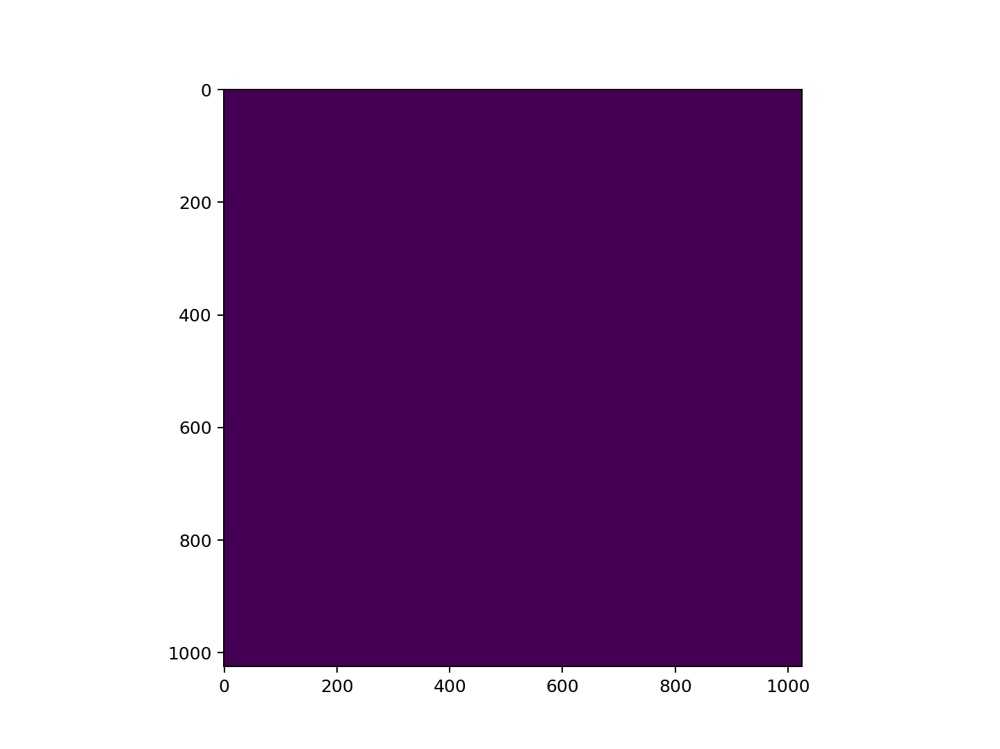

(<Figure size 800x600 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c286eca20>)

In [16]:
trial_nuclei = testData.imageSet[:,:40,:,0]


<IPython.core.display.Javascript object>


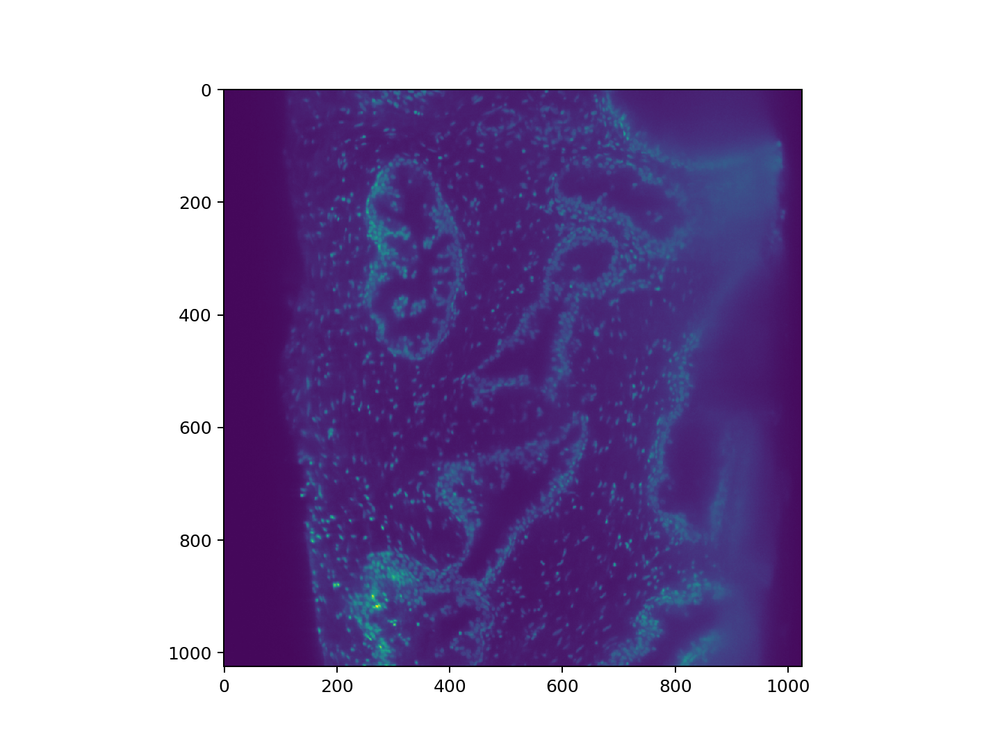

(<Figure size 800x600 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c2fc34c18>)

In [41]:
nuclei_images = testData.imageSet[:,1:100,:,0]
ViewImage(nuclei_images[:,0])
# ViewImage(nuclei_images[20])

In [42]:
nuclei_images.shape
nuclei_images = np.moveaxis(nuclei_images,1,0)

<IPython.core.display.Javascript object>


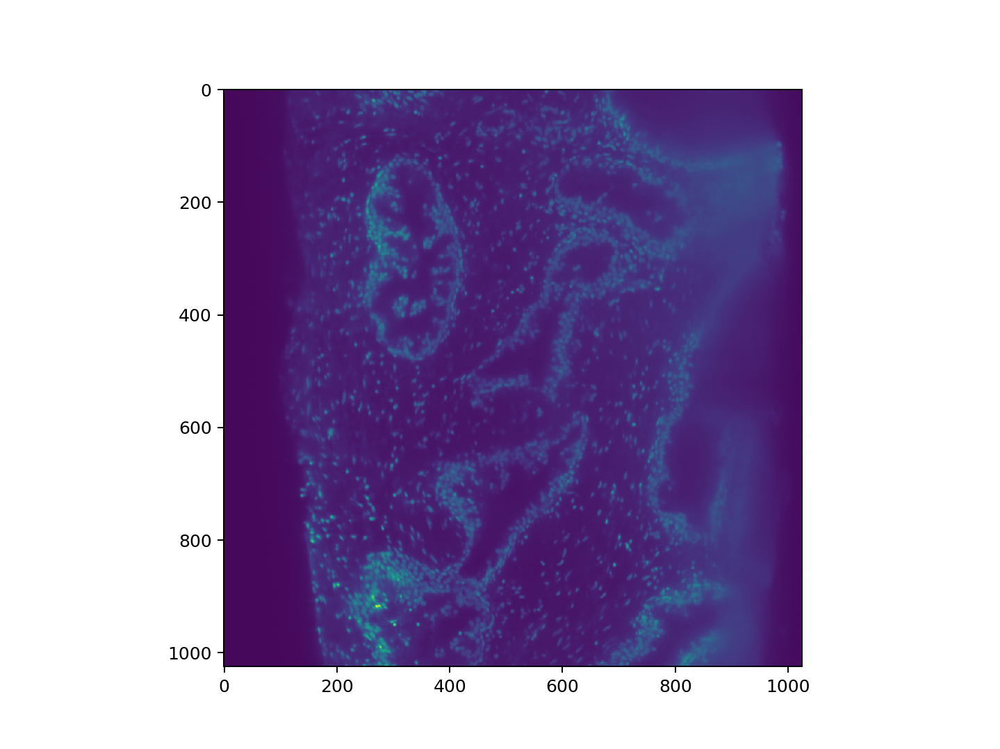

(<Figure size 800x600 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c337b90b8>)

In [43]:
ViewImage(nuclei_images[1])

In [57]:
def tophat_filter(image):
    el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(51,51))
    return cv2.morphologyEx(image,cv2.MORPH_TOPHAT,el)

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:131: UserWarning: Possible sign loss when converting negative image of type int16 to positive image of type uint16.
  .format(dtypeobj_in, dtypeobj_out))
/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int16 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


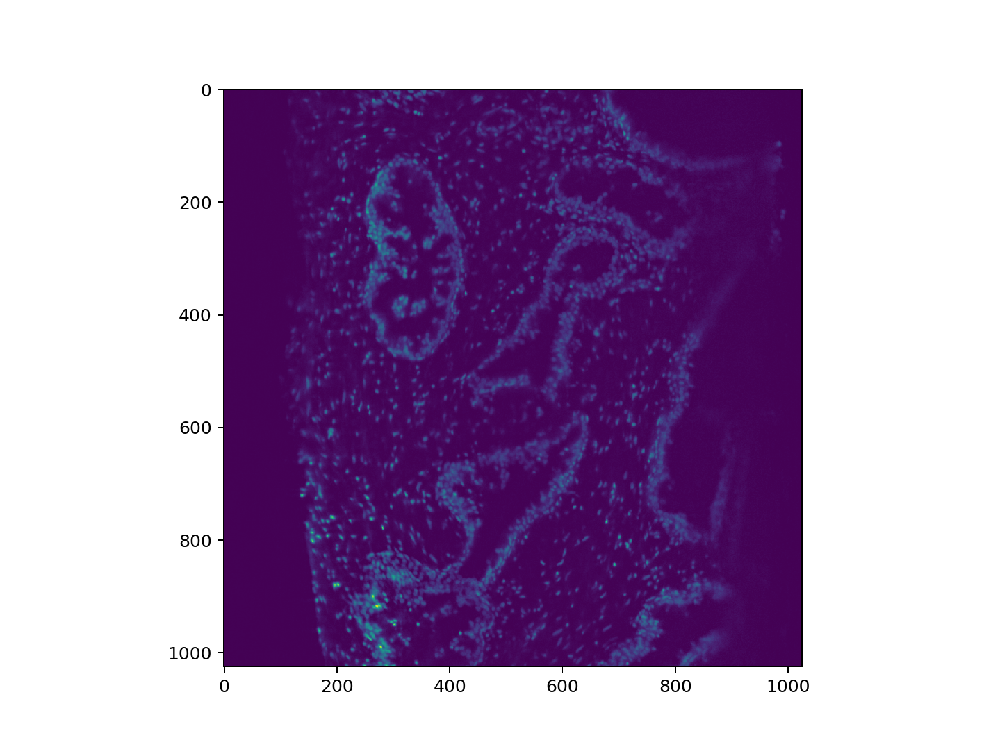

(<Figure size 800x600 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c3e9b6908>)

In [73]:
import skimage.util as util
filtered_nuclei = np.zeros(nuclei_images.shape)
for i,z in enumerate(nuclei_images):
    filtered_nuclei[i] = util.img_as_uint(tophat_filter(z))


ViewImage(filtered_nuclei[0])

<IPython.core.display.Javascript object>


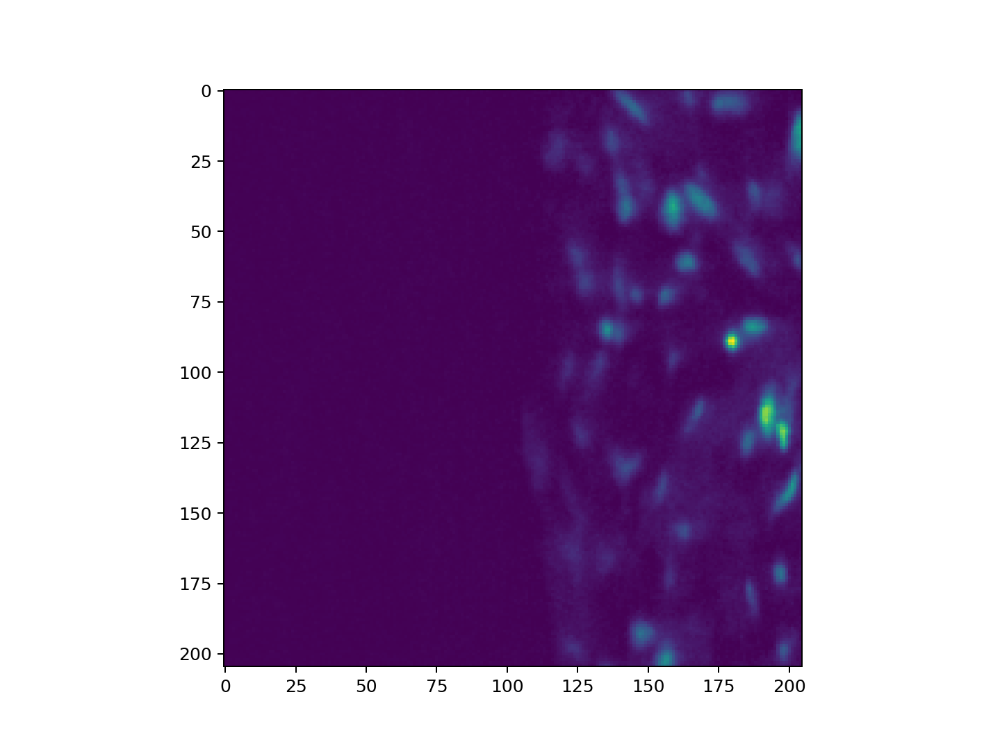

<IPython.core.display.Javascript object>


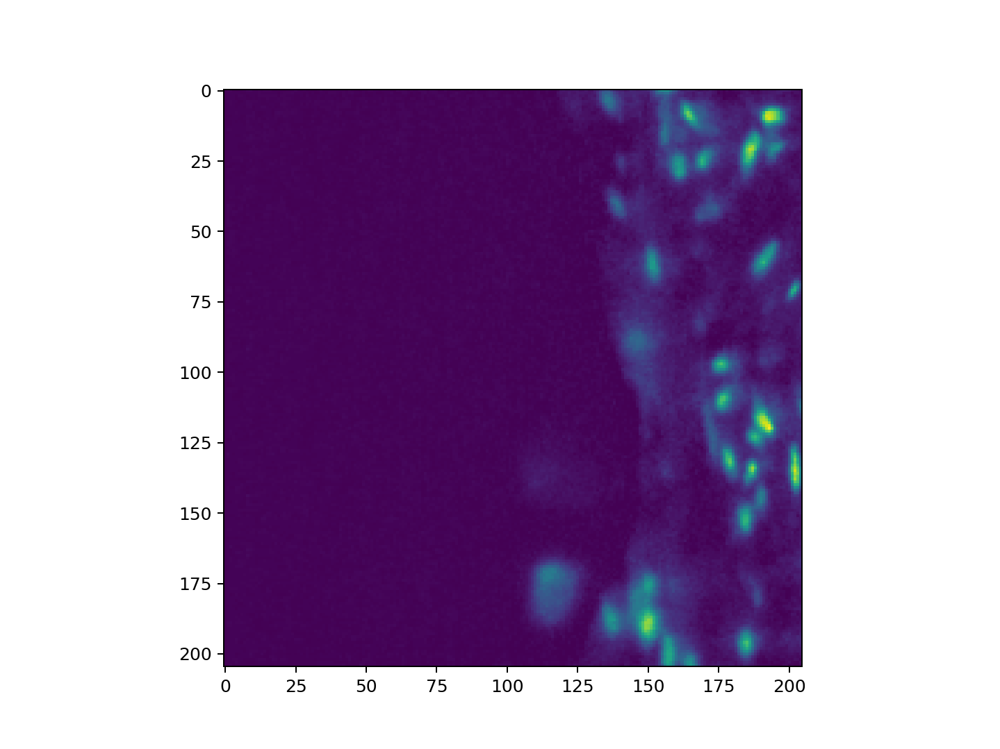

<IPython.core.display.Javascript object>


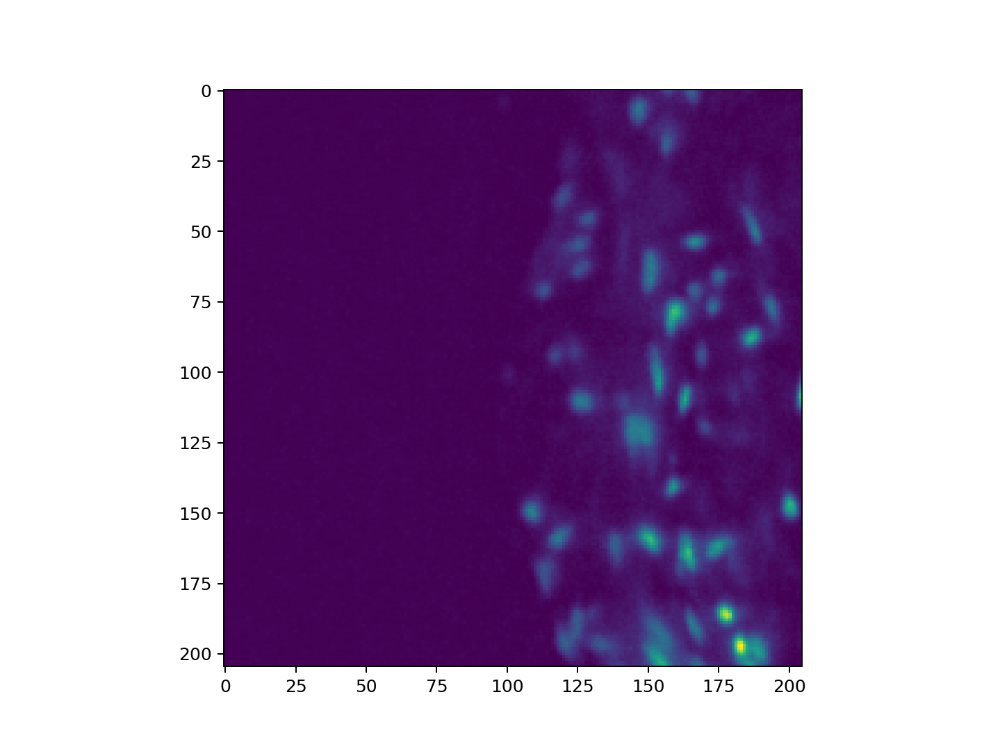

<IPython.core.display.Javascript object>


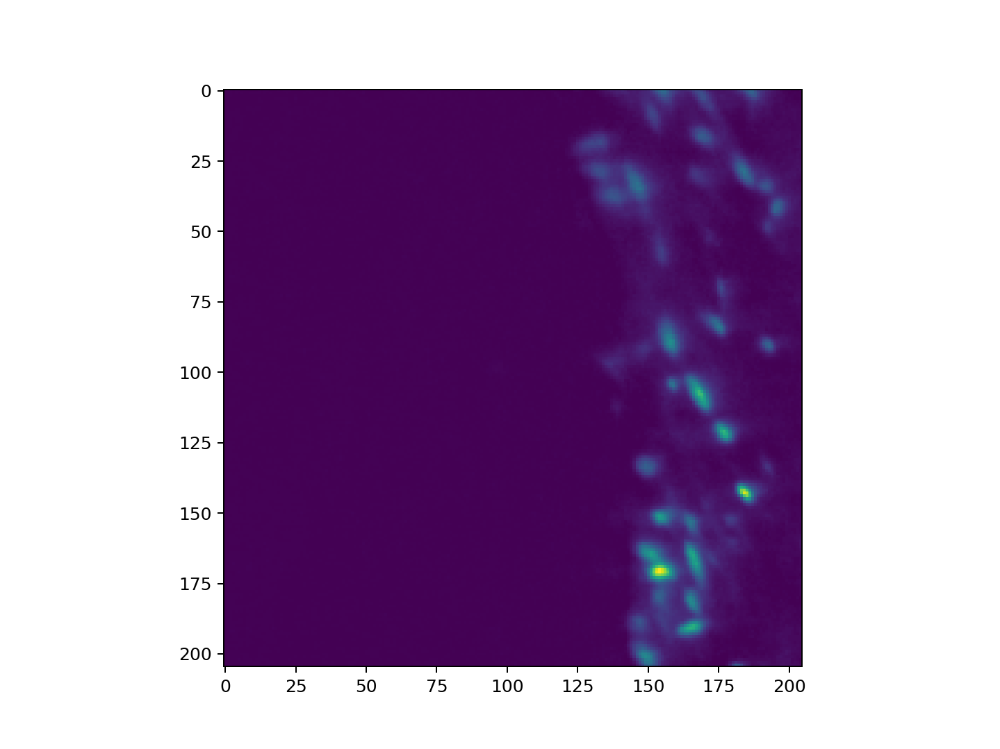

<IPython.core.display.Javascript object>


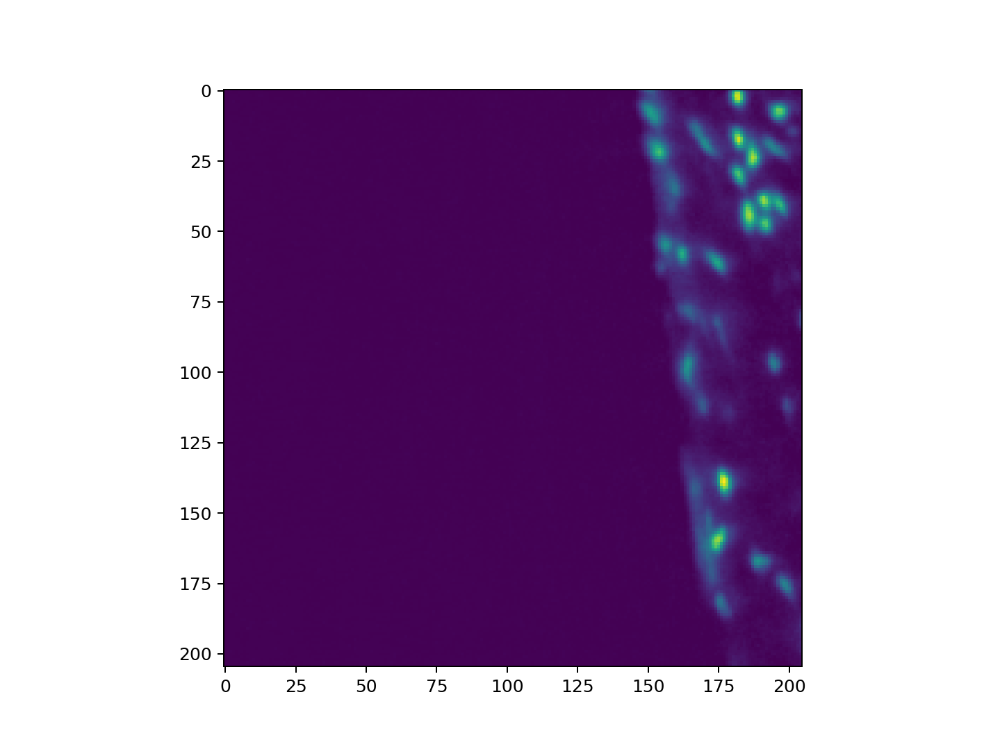

<IPython.core.display.Javascript object>


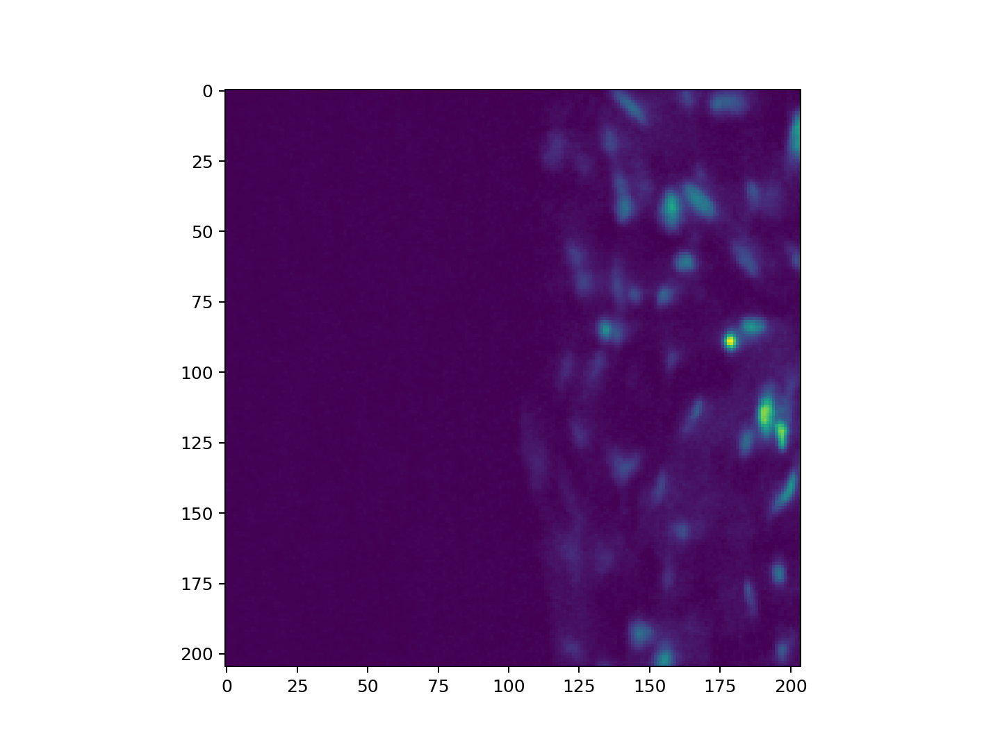

<IPython.core.display.Javascript object>


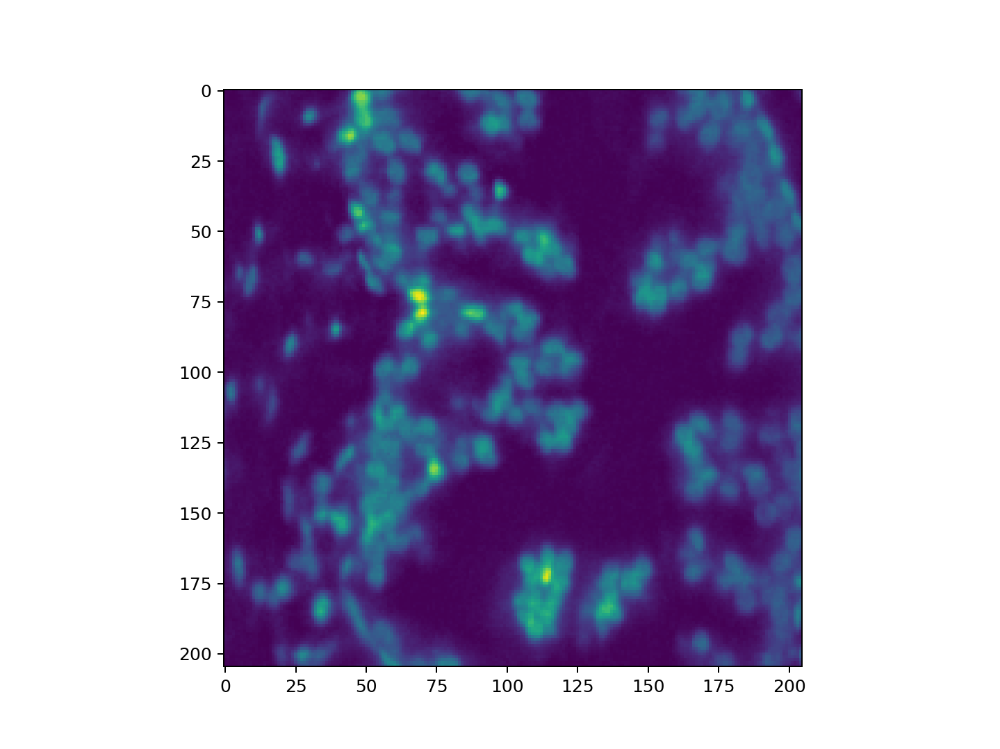

<IPython.core.display.Javascript object>


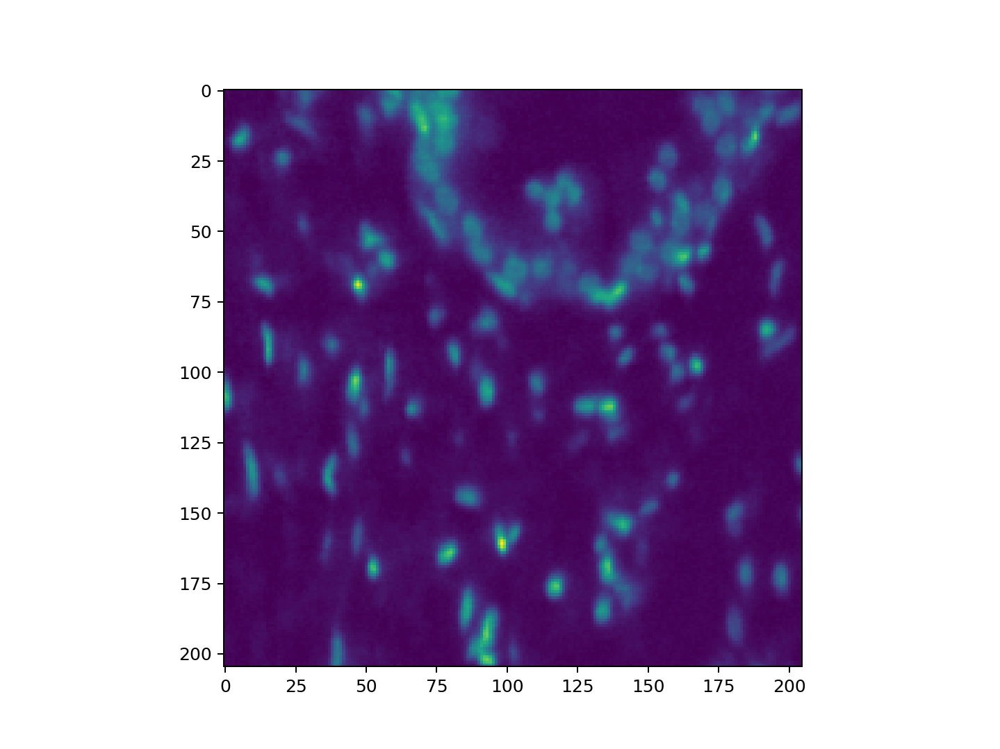

<IPython.core.display.Javascript object>


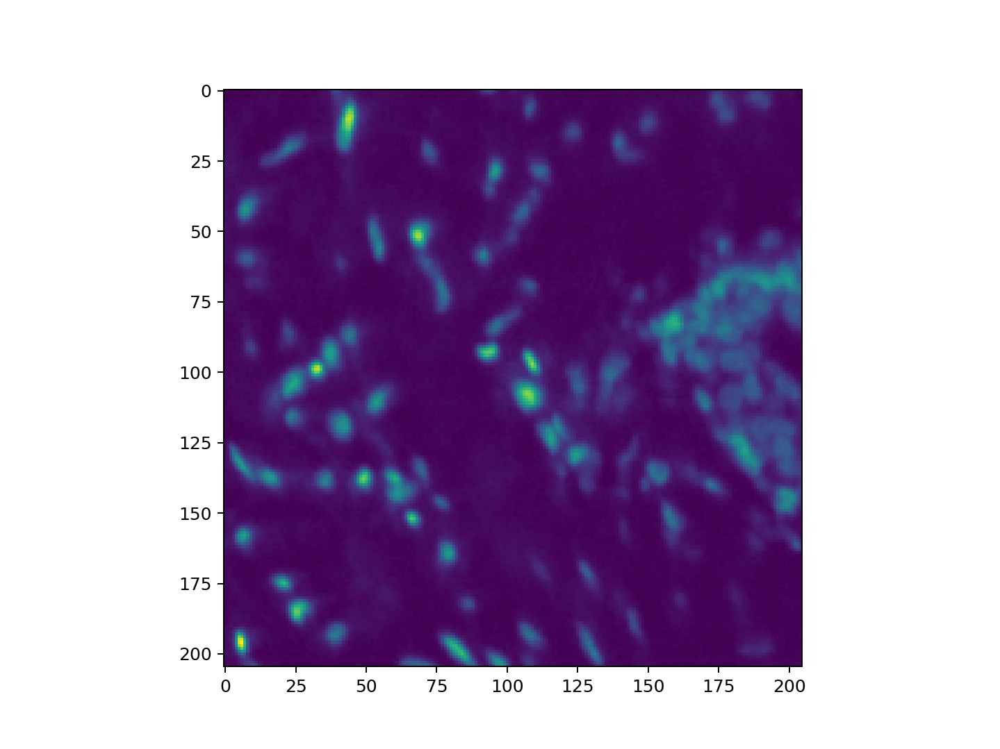

<IPython.core.display.Javascript object>


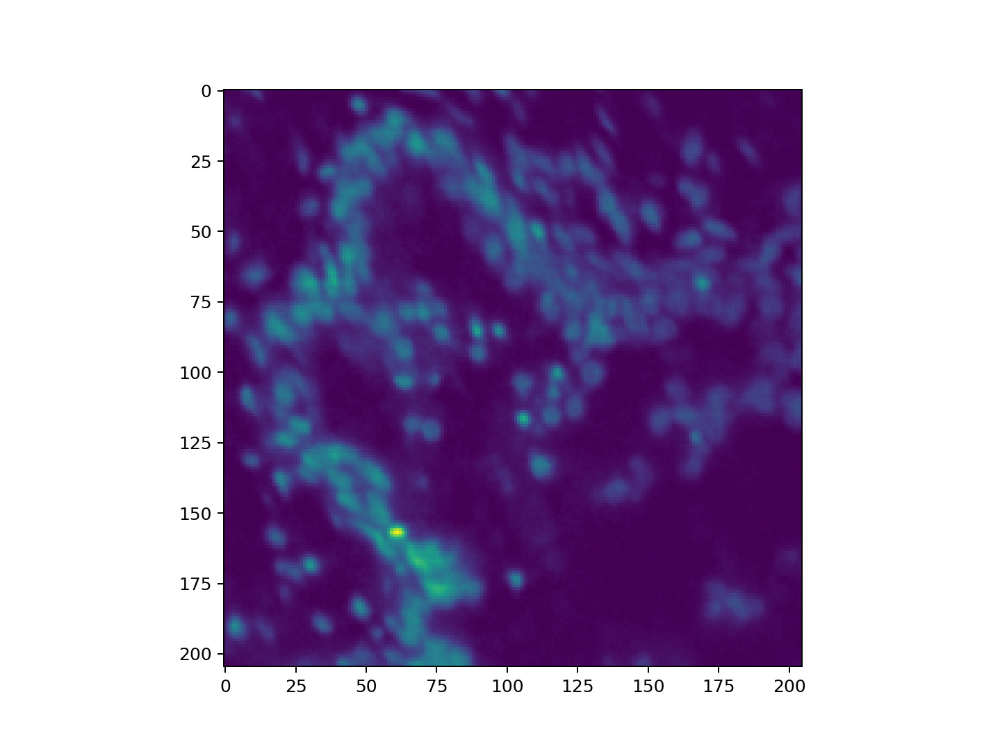

<IPython.core.display.Javascript object>


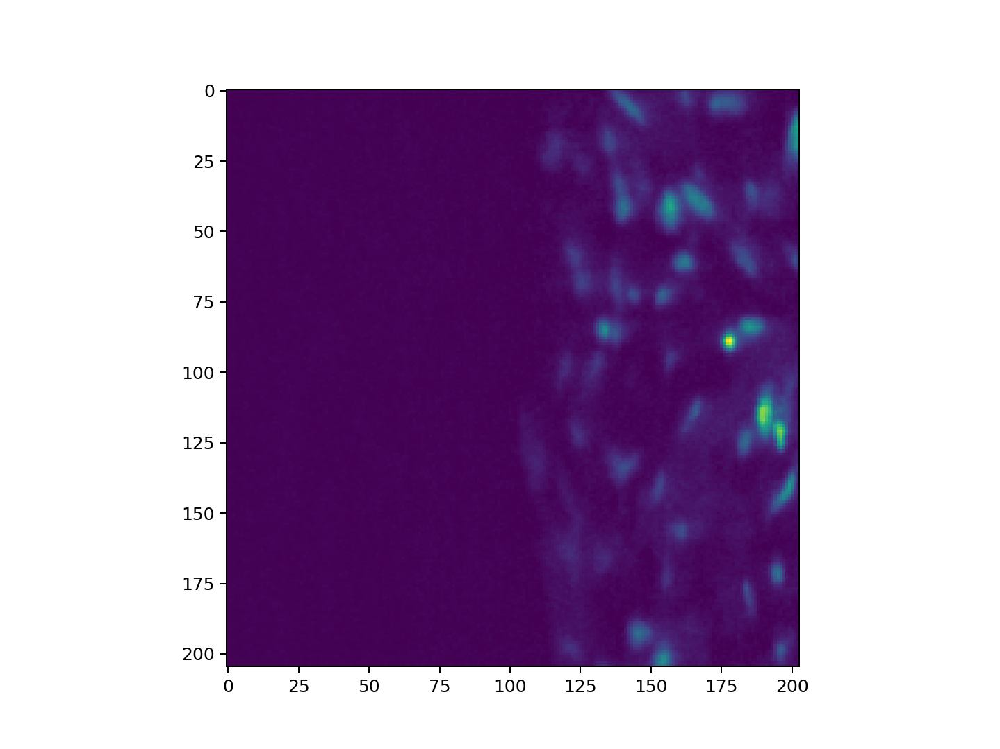

<IPython.core.display.Javascript object>


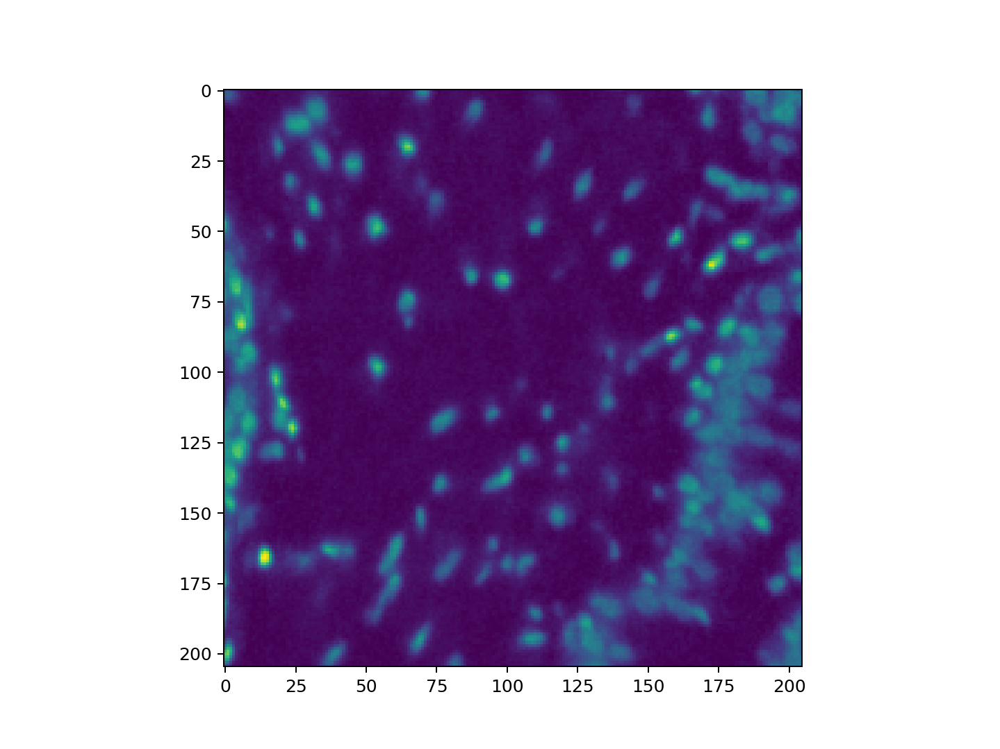

<IPython.core.display.Javascript object>


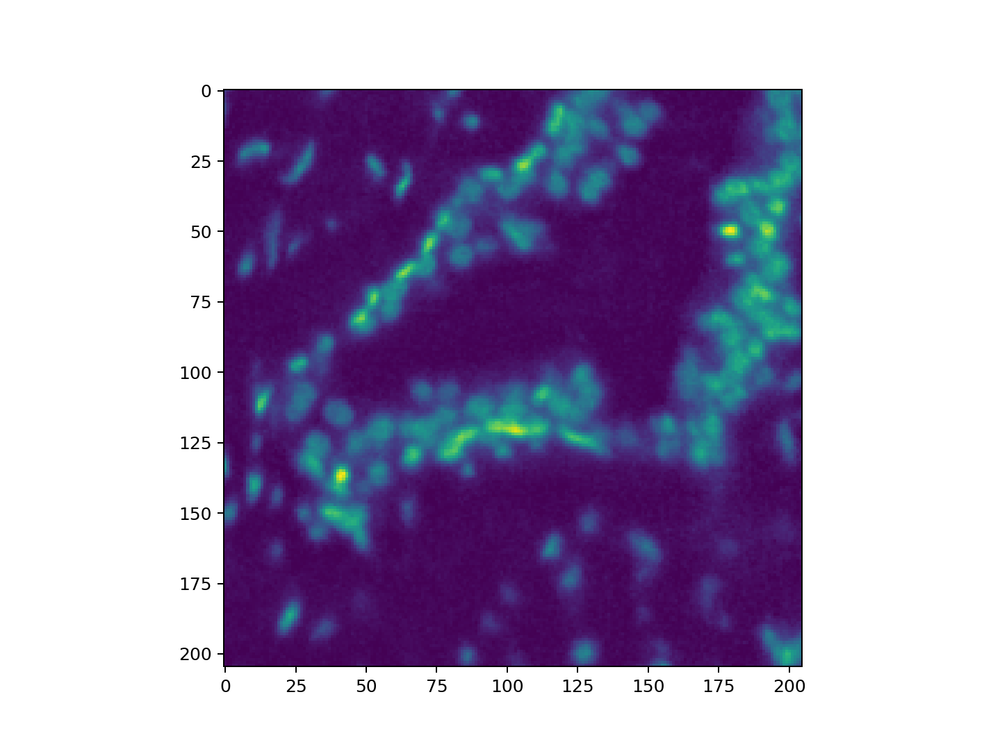

<IPython.core.display.Javascript object>


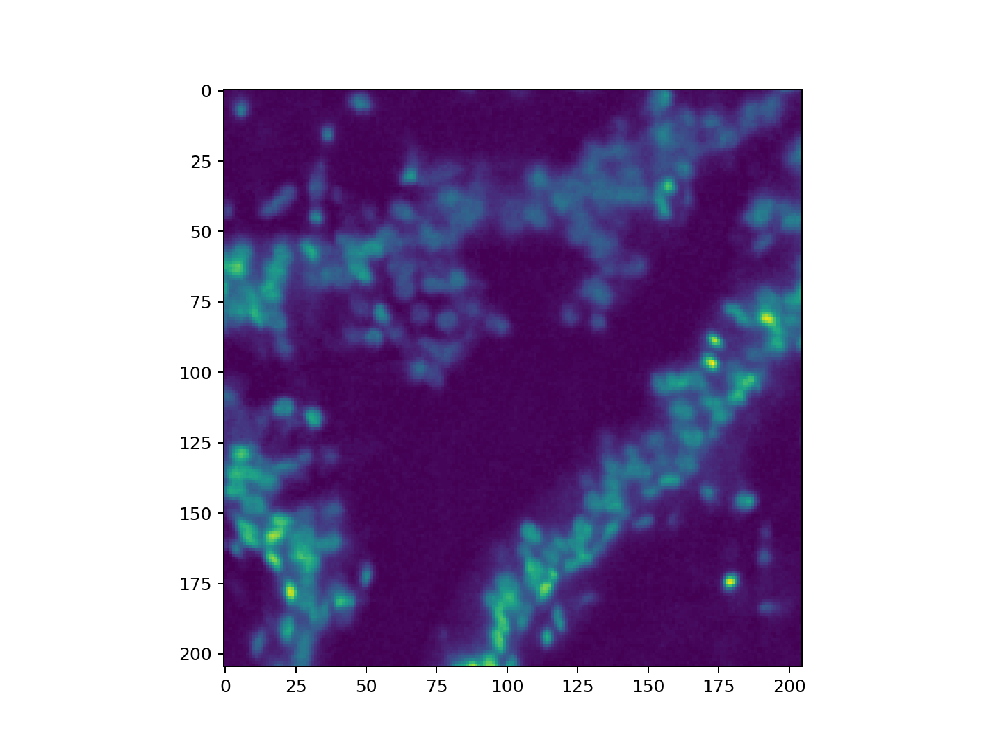

<IPython.core.display.Javascript object>


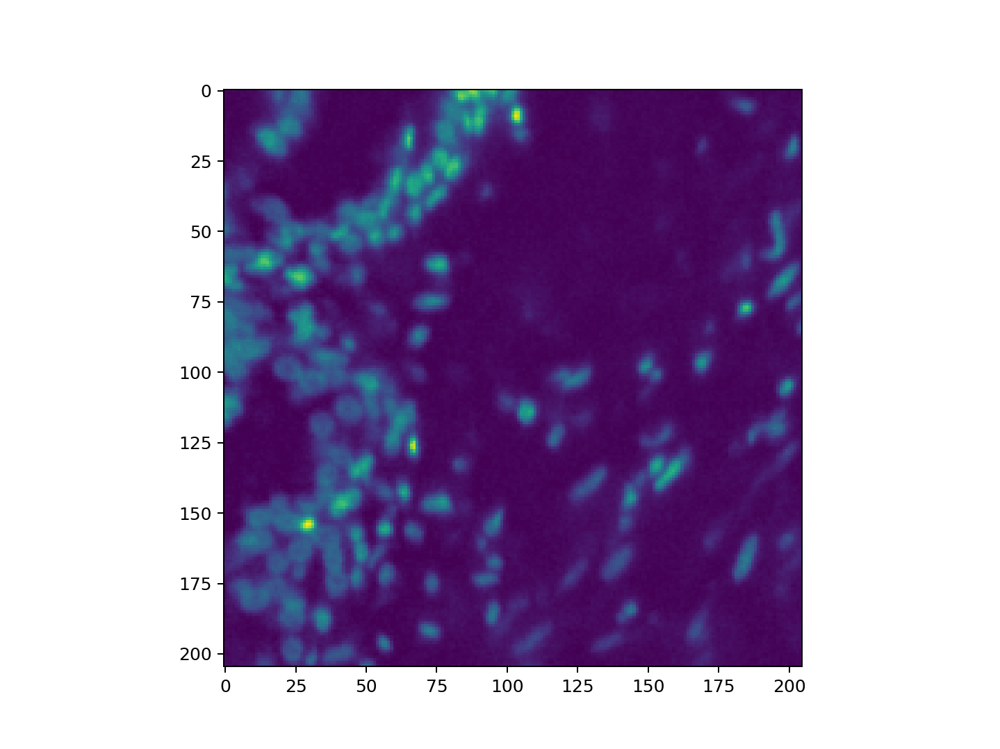

<IPython.core.display.Javascript object>


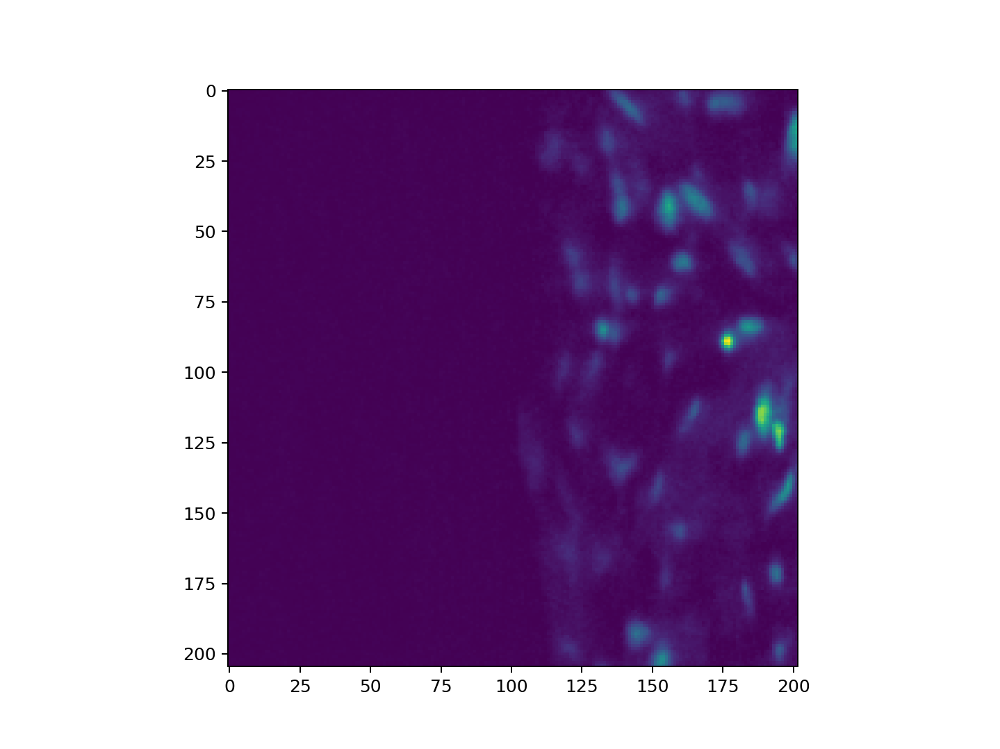

<IPython.core.display.Javascript object>


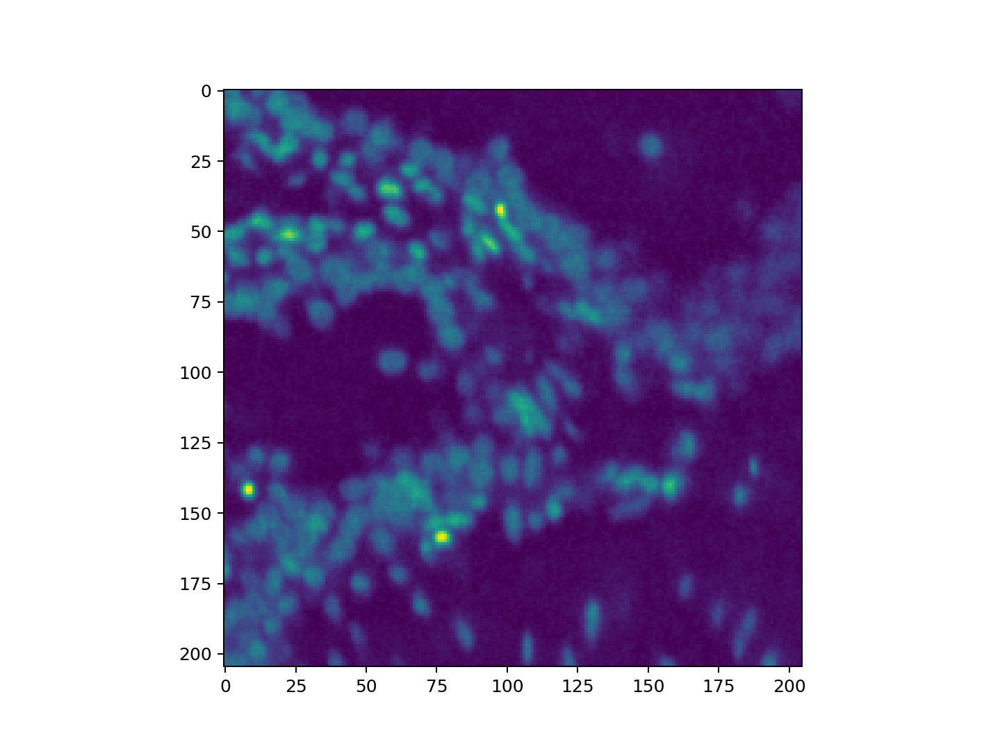

<IPython.core.display.Javascript object>


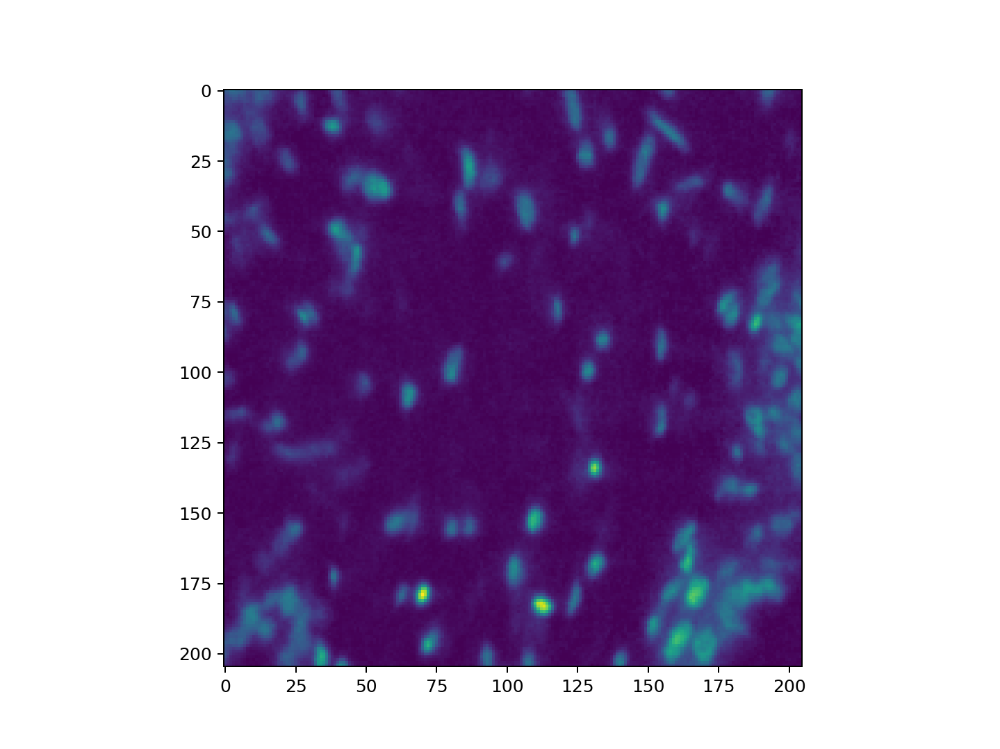

<IPython.core.display.Javascript object>


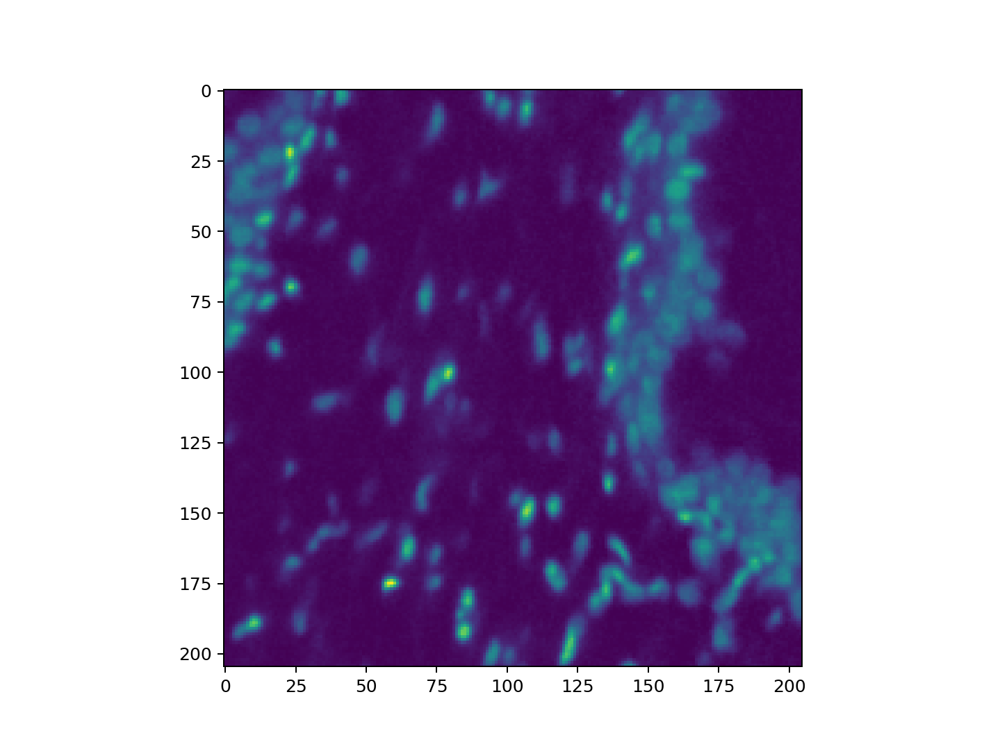

<IPython.core.display.Javascript object>


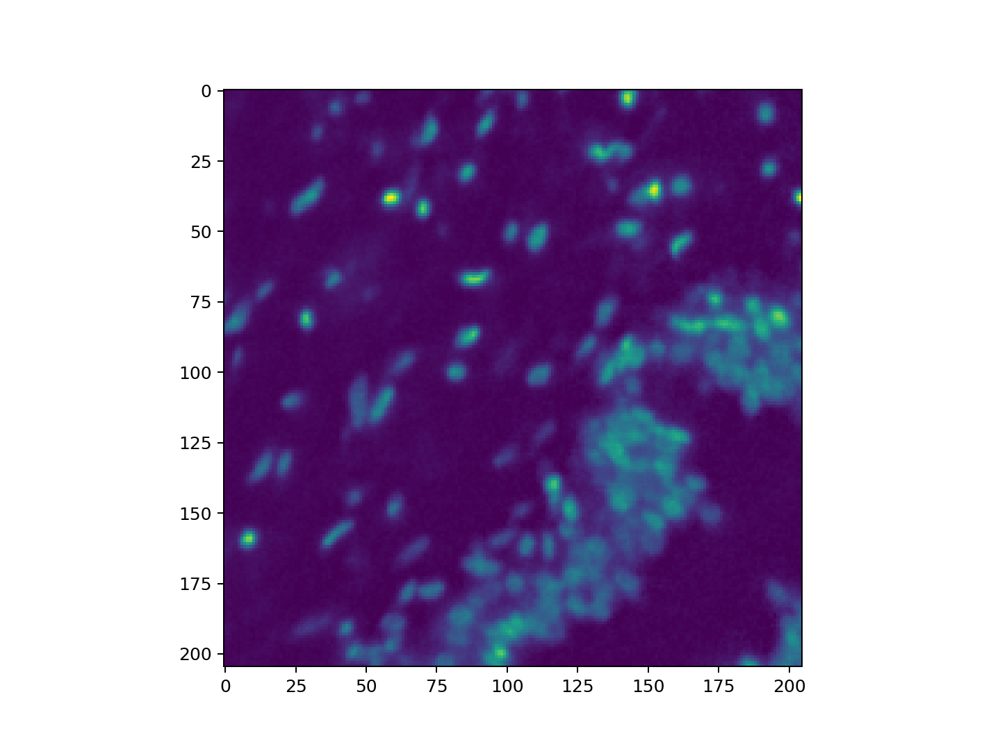

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


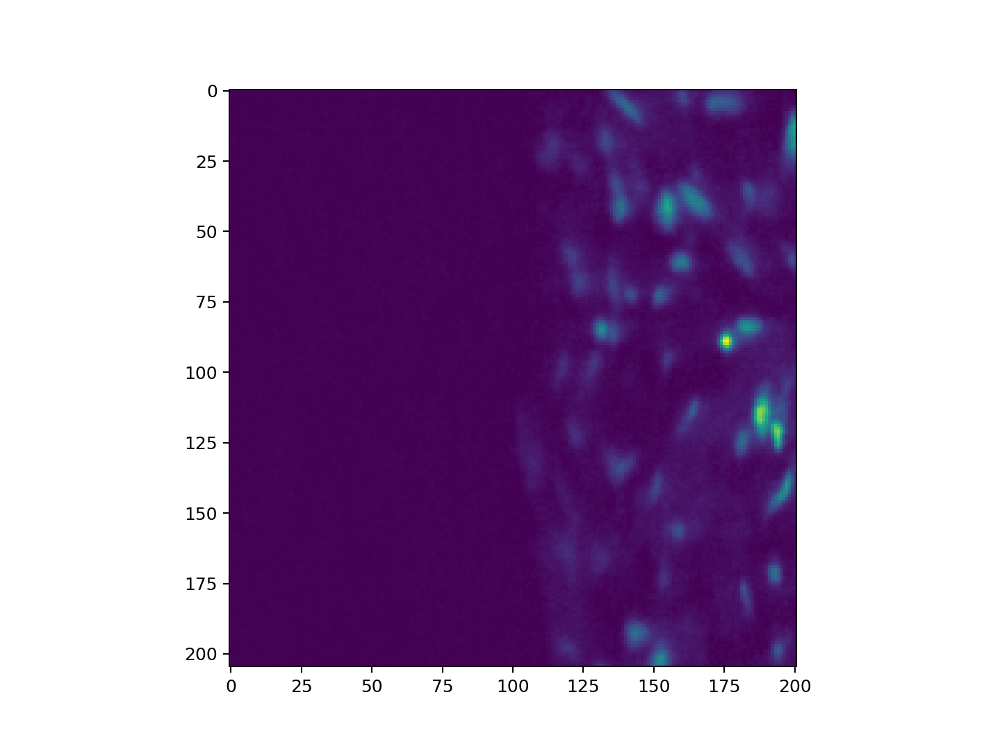

<IPython.core.display.Javascript object>


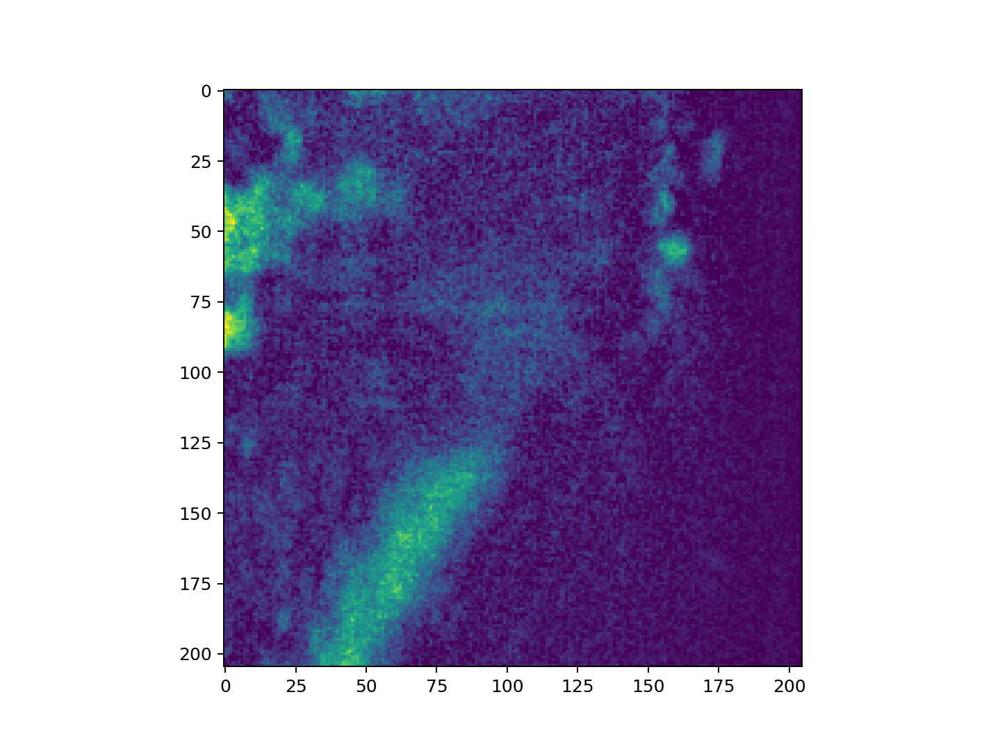

<IPython.core.display.Javascript object>


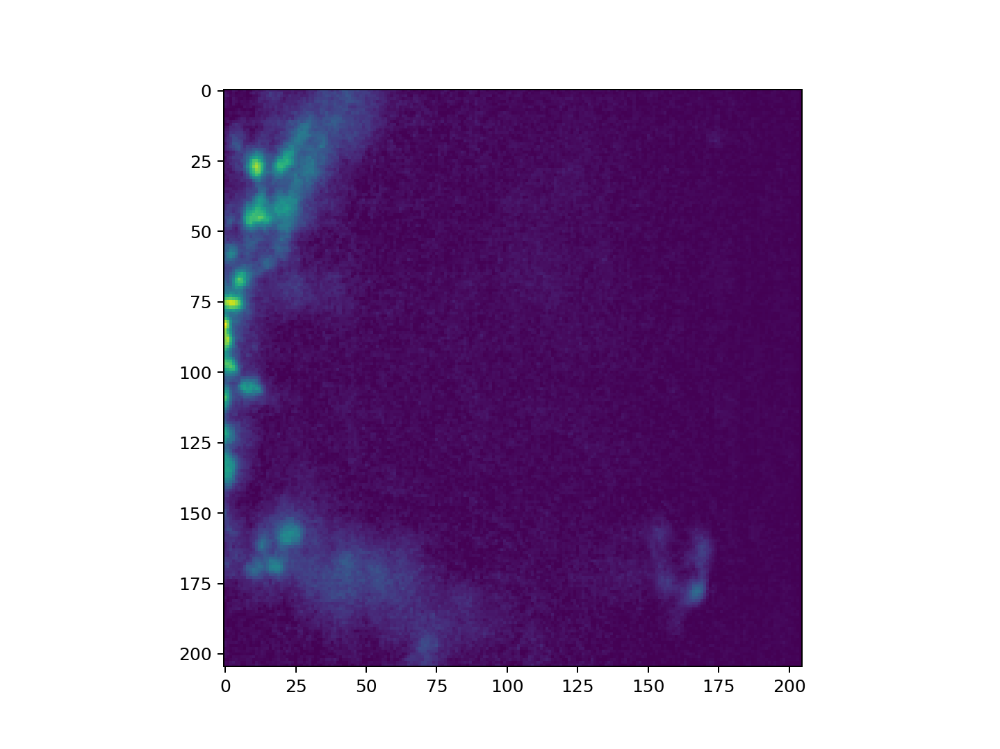

<IPython.core.display.Javascript object>


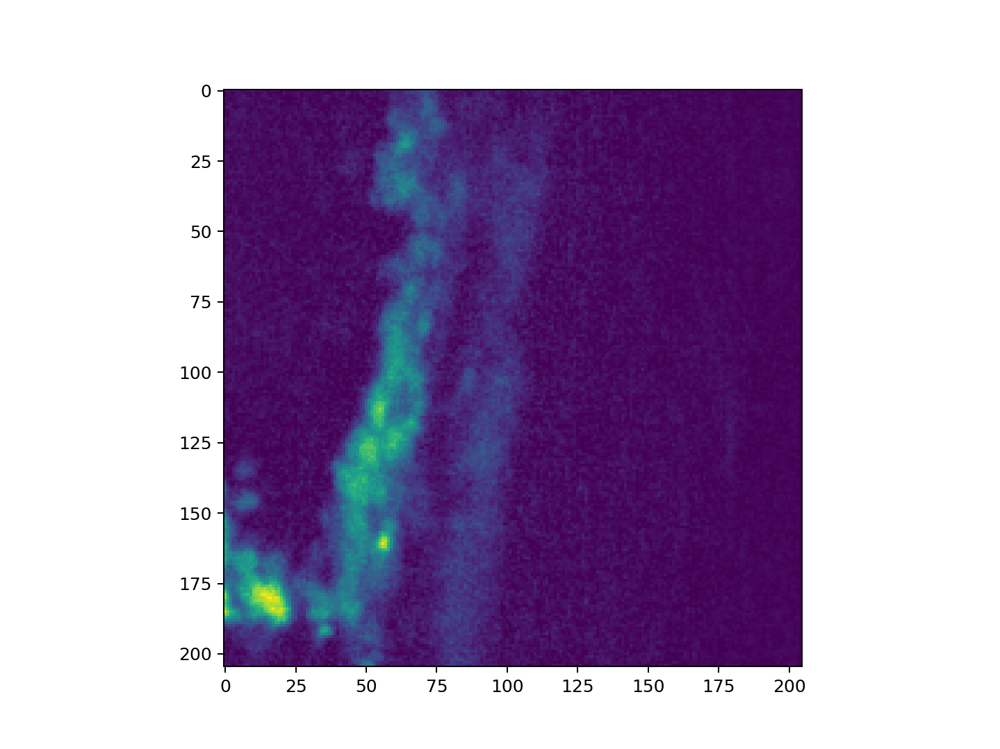

<IPython.core.display.Javascript object>


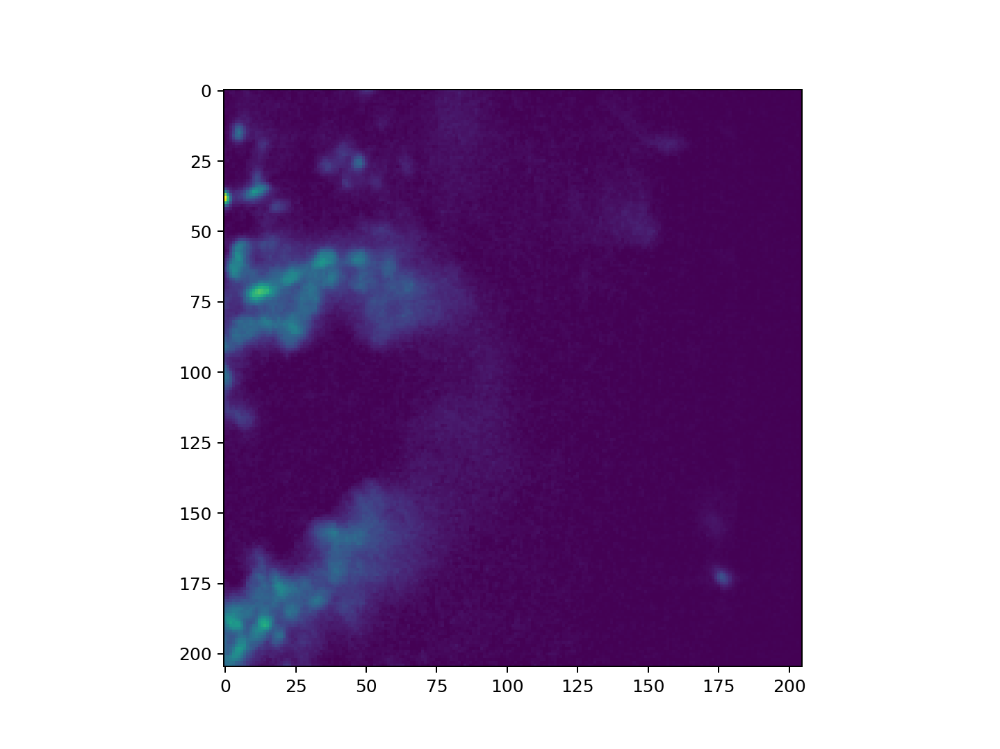

In [110]:
for j in range(5):
    for i in range(5):
        if i == 0:
            chunk = filtered_nuclei[:9,i:205,j:205]
        else:
            chunk = filtered_nuclei[:9,205*i:(1+i)*205,205*j:(1+j)*205]
        ViewImage(chunk[8])

In [80]:
np.arange(4*4*3).reshape(4,4,3)

array([[[ 0,  1,  2],
        [ 3,  4,  5],
        [ 6,  7,  8],
        [ 9, 10, 11]],

       [[12, 13, 14],
        [15, 16, 17],
        [18, 19, 20],
        [21, 22, 23]],

       [[24, 25, 26],
        [27, 28, 29],
        [30, 31, 32],
        [33, 34, 35]],

       [[36, 37, 38],
        [39, 40, 41],
        [42, 43, 44],
        [45, 46, 47]]])

In [87]:
test_blocks[0,:,:].shape

(41, 41, 9, 25, 25)

In [109]:
for j in range(5):
    for i in range(5):
#         print(i,j)
        print(i*205,(i+1)*205,j*205,(j+1)*205)

0 205 0 205
205 410 0 205
410 615 0 205
615 820 0 205
820 1025 0 205
0 205 205 410
205 410 205 410
410 615 205 410
615 820 205 410
820 1025 205 410
0 205 410 615
205 410 410 615
410 615 410 615
615 820 410 615
820 1025 410 615
0 205 615 820
205 410 615 820
410 615 615 820
615 820 615 820
820 1025 615 820
0 205 820 1025
205 410 820 1025
410 615 820 1025
615 820 820 1025
820 1025 820 1025


In [111]:
plt.close('all')